コードが動かない場合にはAPIやライブラリ等がアップデートしている可能性があります。その際には以下のGitHubページにて更新情報がないかご確認ください。

https://github.com/tamanome/satelliteBook

### 線形回帰（回帰）

線形回帰を衛星画像データでどのように適用するかを解説します。サンプルデータとして森林樹
高のグランドトゥルースデータ（正解情報）を用いて、まずは衛星画像から導き出されるNDVI値だけの1
つの変数を使った単回帰分析を行います。
次の手順で進めます。

1.グランドトゥルースデータの準備

2.衛星画像データSentinel-2の準備

3.教師データ作成のための点データ準備

4.線形回帰の実行

#### ［ Step 1］グランドトゥルースデータの準備
静岡県伊豆半島の樹高データを扱います。こちらは航空レーザー測量を利用して作成した、5mメッ
シュの樹高分布図です。樹高データを、ふじのくにオープンデータカタログからダウンロードしましょう。
作業環境にドラッグ&ドロップでアップロードします。Google Colabを利用している場合には、マイドラ
イブの配下にアップロードすると良いでしょう。アップロードが終わったら、樹高データ画像を確認してみ
ます。

In [ ]:
# STACを利用するために、改めてライブラリのインストールを行います
# Colab利用時にはインストール後ランタイムを再起動してください
!pip install rasterio
!pip install geopandas
!pip install geojson
!pip install rioxarray
!pip install rasterstats
!pip install earthpy
!pip install cartopy
!pip install pygeos
!pip install rtree
!pip install sat-search
!pip install pystac-client

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
# ライブラリ読み込み
from osgeo import gdal, gdalconst, gdal_array
import os
import numpy as np
import pandas as pd
os.environ['USE_PYGEOS'] = '0'
import geopandas as gpd
import rasterio as rio
from rasterio.plot import show
import rasterio.mask
from rasterio.crs import CRS
import rioxarray as rxr
from shapely.geometry import MultiPolygon, Polygon, box
import rasterstats as rs
import earthpy.spatial as es
import earthpy.plot as ep
import random
import matplotlib.pyplot as plt
from PIL import Image
import zipfile
from fiona.crs import from_epsg
import json
import requests
from satsearch import Search
from pystac_client import Client
from io import BytesIO
import urllib
import warnings
from skimage import io
warnings.filterwarnings('ignore')
%matplotlib inline
plt.rcParams['figure.dpi'] = 250

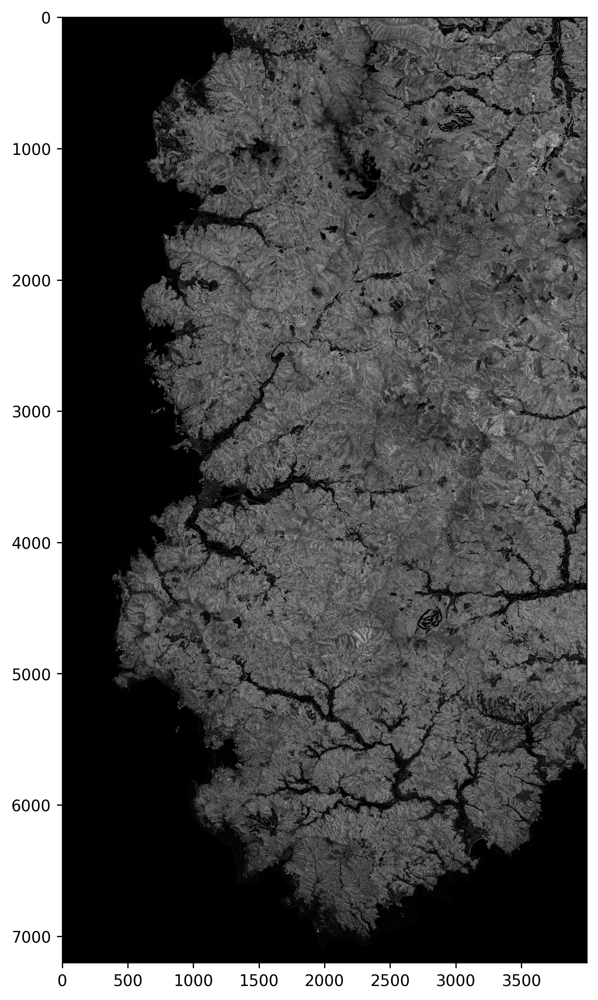

In [2]:
#画像サイズに合わせて数値を設定します
offx = 0
offy = 0
cols = 4000
rows = 7200

# ファイルの場所は適宜変えて下さい
tif = gdal.Open('/content/drive/MyDrive/playground/satBooks/shizuokaTreeHeight/Izu.tif', gdalconst.GA_ReadOnly)
izuimg = tif.GetRasterBand(1).ReadAsArray(offx, offy, cols, rows)

# 画像データの値に合わせて設定します
plt.figure(figsize = (6,12))
plt.imshow(izuimg,cmap='gray', vmin = 0, vmax = 53, interpolation = 'none')

#### ［ Step 2］画像のリサンプリング
今回使用するSentinel-2の衛星画像は地上分解能が10mですが、グランドトゥルースデータ（以下、伊豆
データ）である樹高データは分解能が5mです。解析するためにはデータ同士の分解能を合わせる必要があ
り、この作業をリサンプリングといいます。今回は5m分解能の伊豆データをSentinel-2の10m分解能に合
わせます。分解能を下げるリサンプリングを特にダウンサンプリングといいます。

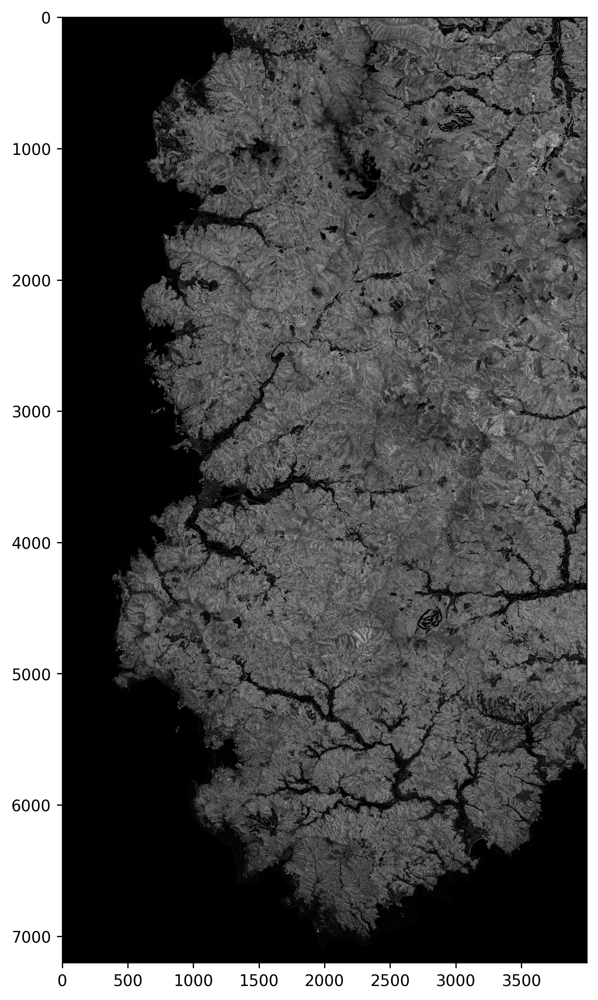

In [3]:
#画像サイズに合わせて数値を設定します
offx = 0
offy = 0
cols = 4000
rows = 7200

# ファイルの場所は適宜変えて下さい
tif = gdal.Open('/content/drive/MyDrive/playground/satBooks/shizuokaTreeHeight/Izu.tif', gdalconst.GA_ReadOnly)
izuimg = tif.GetRasterBand(1).ReadAsArray(offx, offy, cols, rows)

# 画像データの値に合わせて設定します
plt.figure(figsize = (6,12))
plt.imshow(izuimg,cmap='gray', vmin = 0, vmax = 53, interpolation = 'none')

In [4]:
ds = gdal.Open("/content/drive/MyDrive/playground/satBooks/shizuokaTreeHeight/Izu.tif")

# reproject
dsReprj = gdal.Warp("/content/drive/MyDrive/IzuReprj.tif", ds, dstSRS = "EPSG:32654")

# resample 5m->10m
# 現在の作業ディレクトリにファイルを保存
dsRes = gdal.Warp("/content/drive/MyDrive/IzuResMean.tif", dsReprj, xRes = 10, yRes = 10, resampleAlg = "average") # リサンプリング後の解像度 (10m)
# dsRes = gdal.Warp("IzuResNear.tif", dsReprj, xRes = 10, yRes = 10, resampleAlg = "near") # リサンプリング後の解像度 (10m)

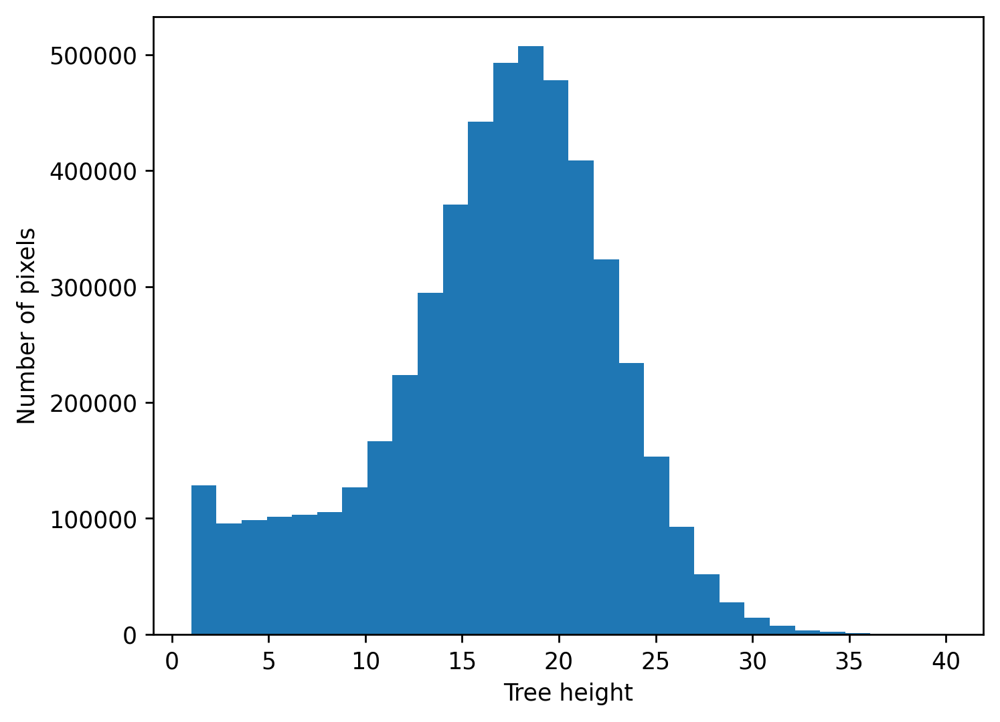

In [5]:
#樹高データ
dsres_arr = dsRes.GetRasterBand(1).ReadAsArray()
# print(dsres_arr) #樹高データの結果確認

#分布を確認(ヒストグラム)
tree_height_data = dsres_arr.flatten()

plt.xlabel('Tree height')
plt.ylabel('Number of pixels')
plt.hist(tree_height_data.ravel(),30,[1,40]) # 1m以上以上40m以下
plt.show()

#### ［ Step 3］衛星画像データSentinel-2の準備
Sentinel-2のデータをダウンロードします。まずは、画像の取得範囲を決定しましょう。

In [6]:
# 伊豆半島に西側を関心領域に設定する
from IPython.display import IFrame
src = 'https://www.keene.edu/campus/maps/tool/'
IFrame(src, width=960, height=500)

## Import用
# 138.7339597, 34.9782520
# 138.7312132, 34.8002724
# 138.8987502, 34.8081657
# 138.8877641, 34.9748762
# 138.7339597, 34.9782520

In [7]:
aoi = [
      [
        138.7339597,
        34.978252
      ],
      [
        138.7312132,
        34.8002724
      ],
      [
        138.8987502,
        34.8081657
      ],
      [
        138.8877641,
        34.9748762
      ],
      [
        138.7339597,
        34.978252
      ]
    ]

In [8]:
# 関心領域の最小緯度・経度、最大緯度・経度を取得します
areaLon = []
areaLat = []
# iterating each number in list
for coordinate in aoi:
  areaLon.append(coordinate[0])
  areaLat.append(coordinate[1])

minLon = np.min(areaLon) # min longitude
maxLon = np.max(areaLon) # max longitude
minLat = np.min(areaLat) # min latitude
maxLat = np.max(areaLat) # max latitude

In [9]:
# 取得範囲を指定するための関数を定義
def selSquare(minLon, minLat, maxLon, maxLat):
   c1 = [maxLon, maxLat]
   c2 = [maxLon, minLat]
   c3 = [minLon, minLat]
   c4 = [minLon, maxLat]
   geometry = {"type": "Polygon", "coordinates": [[ c1, c2, c3, c4, c1 ]]}
   return geometry

In [10]:
bbox = selSquare(minLon, minLat, maxLon, maxLat) # 画像取得範囲の設定 min lon, min lat, max lon, max lat
dates = '2020-01-01/2020-12-31'

api_url = 'https://earth-search.aws.element84.com/v0'
collection = "sentinel-s2-l2a-cogs"  # Sentinel-2, Level 2A (BOA)
s2STAC = Client.open(api_url, headers=[])


s2Search = s2STAC.search (
   intersects = bbox,
   datetime = dates,
   query = {"eo:cloud_cover": {"lt": 30}, "sentinel:valid_cloud_cover": {"eq": True}},
   collections = collection)

s2_items = [i.to_dict() for i in s2Search.get_items()]
print(f"{len(s2_items)} のシーンを取得")

56 のシーンを取得


In [13]:
items = s2Search.get_all_items()
gf = gpd.GeoDataFrame.from_features(items.to_dict(), crs="epsg:4326")
# 雲量で並び替え
gfSorted = gf.sort_values('eo:cloud_cover').reset_index(drop=True)
gfSorted.head()

,geometry,created,sentinel:product_id,sentinel:sequence,view:off_nadir,sentinel:valid_cloud_cover,platform,sentinel:utm_zone,proj:epsg,sentinel:grid_square,datetime,instruments,constellation,eo:cloud_cover,gsd,sentinel:latitude_band,sentinel:data_coverage,updated,data_coverage
0,"POLYGON ((137.74383 34.20968, 137.70483 35.198...",2020-09-19T00:36:59.662Z,S2A_MSIL2A_20200502T012701_N0214_R074_T54STD_2...,0,0,True,sentinel-2a,54,32654,TD,2020-05-02T01:37:43Z,[msi],sentinel-2,0.00,10,S,100.0,2020-09-19T00:36:59.662Z,100.0
1,"POLYGON ((138.82851 34.23370, 138.80247 35.223...",2020-12-26T01:09:12.361Z,S2B_MSIL2A_20201223T013049_N0214_R074_T54SUD_2...,0,0,True,sentinel-2b,54,32654,UD,2020-12-23T01:37:33Z,[msi],sentinel-2,0.00,10,S,100.0,2020-12-26T01:09:12.361Z,NaN
2,"POLYGON ((137.74383 34.20968, 137.70483 35.198...",2020-12-08T06:35:20.064Z,S2A_MSIL2A_20201208T013041_N0214_R074_T54STD_2...,0,0,True,sentinel-2a,54,32654,TD,2020-12-08T01:37:37Z,[msi],sentinel-2,0.01,10,S,100.0,2020-12-08T06:35:20.064Z,NaN
3,"POLYGON ((137.74383 34.20968, 137.70483 35.198...",2020-08-17T06:26:28.759Z,S2B_MSIL2A_20200815T012659_N0214_R074_T54STD_2...,0,0,True,sentinel-2b,54,32654,TD,2020-08-15T01:37:43Z,[msi],sentinel-2,0.05,10,S,100.0,2020-08-17T06:26:28.759Z,NaN
4,"POLYGON ((138.82851 34.23370, 138.80247 35.223...",2020-09-20T08:41:11.778Z,S2A_MSIL2A_20200502T012701_N0214_R074_T54SUD_2...,0,0,True,sentinel-2a,54,32654,UD,2020-05-02T01:37:39Z,[msi],sentinel-2,0.05,10,S,100.0,2020-09-20T08:41:11.778Z,100.0


In [14]:
# 最も雲の量が少ないシーンを選択し、サムネイル画像も取得する関数を定義します。
def sel_items(scene_items, product_id):
 item = [x.assets for x in scene_items\
         if x.properties['sentinel:product_id'] == product_id]
 thumbUrl = [x.assets['thumbnail'].href for x in scene_items\
             if x.properties['sentinel:product_id'] == product_id]
 return item, thumbUrl

selected_item, thumbUrl = sel_items(items, gfSorted['sentinel:product_id'][0])
print(thumbUrl)
print(selected_item)

['https://roda.sentinel-hub.com/sentinel-s2-l1c/tiles/54/S/TD/2020/5/2/0/preview.jpg']
[{'overview': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/TD/2020/5/S2A_54STD_20200502_0_L2A/L2A_PVI.tif>, 'thumbnail': <Asset href=https://roda.sentinel-hub.com/sentinel-s2-l1c/tiles/54/S/TD/2020/5/2/0/preview.jpg>, 'metadata': <Asset href=https://roda.sentinel-hub.com/sentinel-s2-l2a/tiles/54/S/TD/2020/5/2/0/metadata.xml>, 'B11': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/TD/2020/5/S2A_54STD_20200502_0_L2A/B11.tif>, 'B01': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/TD/2020/5/S2A_54STD_20200502_0_L2A/B01.tif>, 'B12': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/TD/2020/5/S2A_54STD_20200502_0_L2A/B12.tif>, 'B02': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/54/S/TD/2020/5/S2A_54STD_20200502_0_L

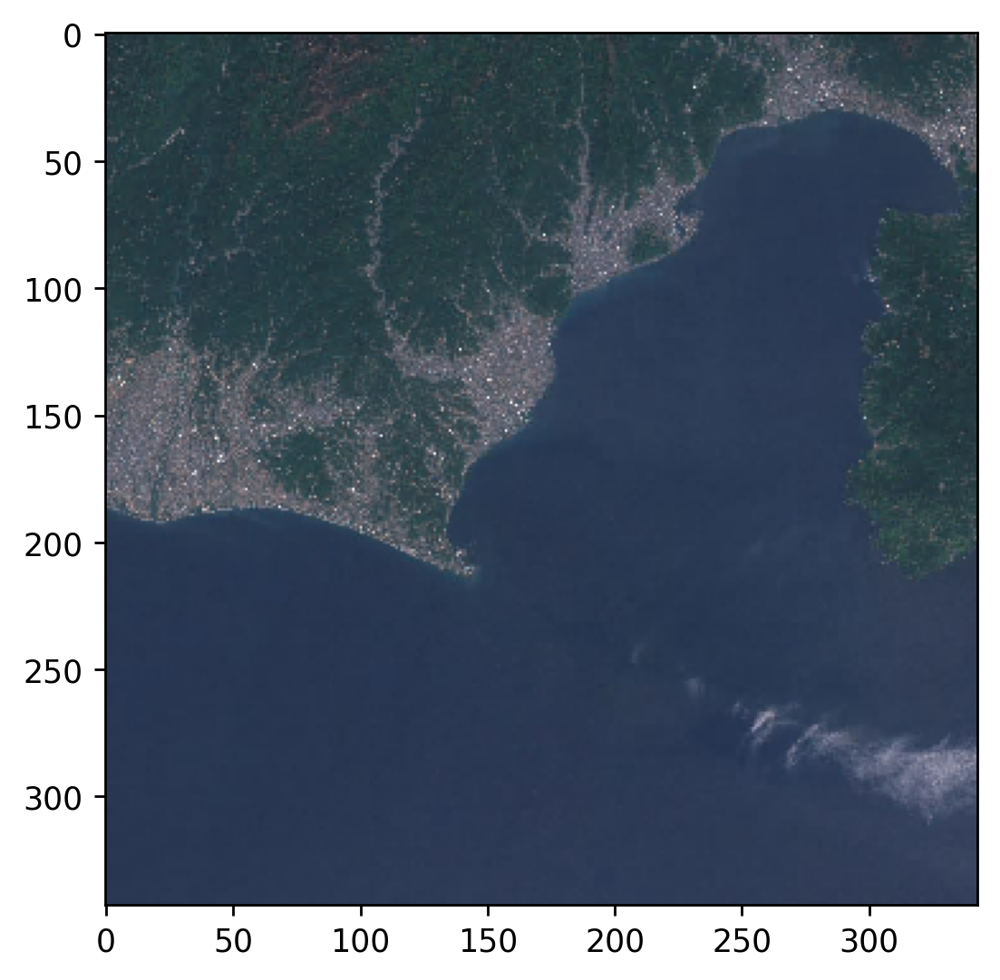

In [15]:
thumbImg = Image.open(BytesIO(requests.get(thumbUrl[0]).content))
plt.figure(figsize=(5,5))
plt.imshow(thumbImg)

In [16]:
def getPreview(thumbList, r_num, c_num, figsize_x=12, figsize_y=12):
  """
  サムネイル画像を指定した引数に応じて行列状に表示
  r_num: 行数
  c_num: 列数
  """
  thumbs = thumbList
  f, ax_list = plt.subplots(r_num, c_num, figsize=(figsize_x,figsize_y))
  for row_num, ax_row in enumerate(ax_list):
    for col_num, ax in enumerate(ax_row):
      if len(thumbs) < r_num*c_num:
        len_shortage = r_num*c_num - len(thumbs) # 行列の不足分を算出
        count = row_num * c_num + col_num
        if count < len(thumbs):
          ax.label_outer() # サブプロットのタイトルと、軸のラベルが被らないようにします
          ax.imshow(io.imread(thumbs[row_num * c_num + col_num]))
          ax.set_title(thumbs[row_num * c_num + col_num][60:79])
        else:
          for i in range(len_shortage):
            blank = np.zeros([100,100,3],dtype=np.uint8)
            blank.fill(255)
            ax.label_outer()
            ax.imshow(blank)
      else:
        ax.label_outer()
        ax.imshow(io.imread(thumbs[row_num * c_num + col_num]))
        ax.set_title(thumbs[row_num * c_num + col_num][60:79])
  return plt.show()

In [17]:
allthumbUrl = []
for item in items:
  allthumbUrl.append(item.assets['thumbnail'].href)

len(allthumbUrl)

56

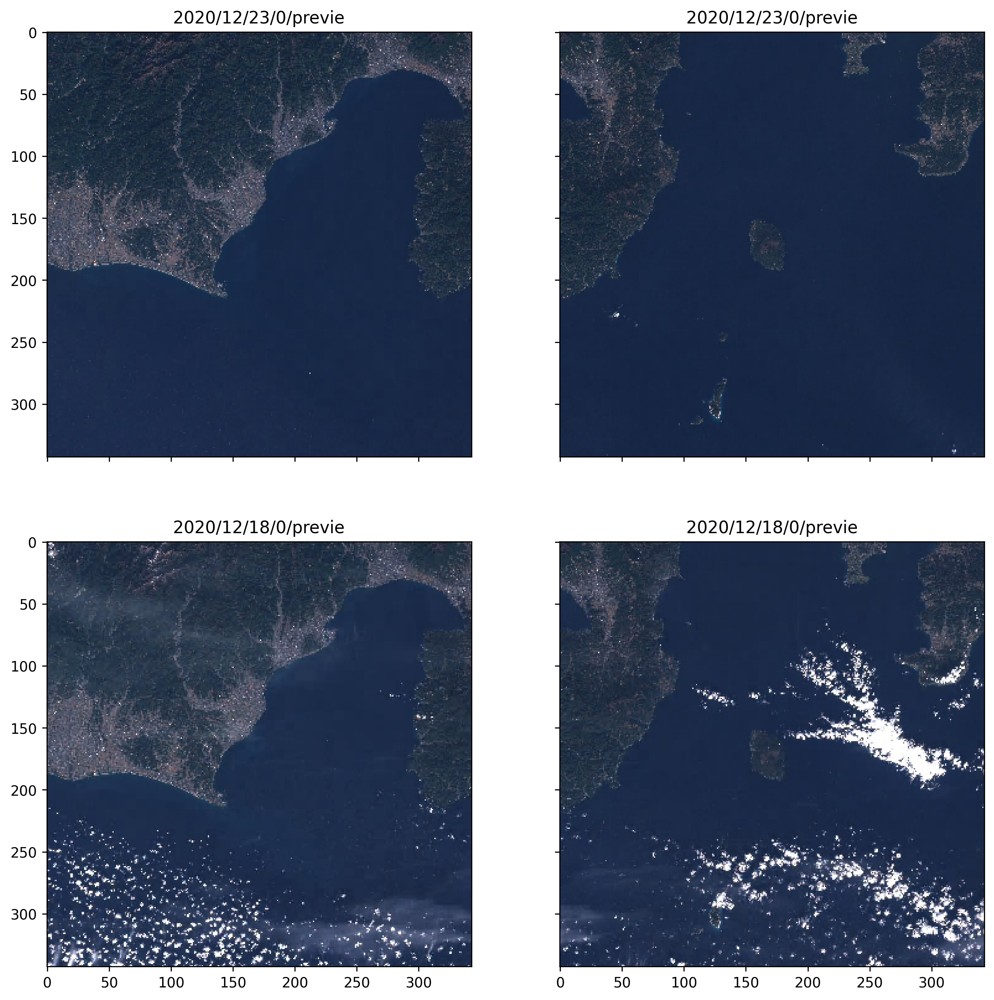

In [18]:
getPreview(allthumbUrl,2,2)

In [19]:
# 引用：https://note.nkmk.me/python-download-web-images/
def download_file(url, dst_path):
   try:
       with urllib.request.urlopen(url) as web_file, open(dst_path, 'wb') as local_file:
           local_file.write(web_file.read())
   except urllib.error.URLError as e:
       print(e)

def download_file_to_dir(url, dst_dir):
   download_file(url, os.path.join(dst_dir, os.path.basename(url)))

In [21]:
# 画像の作成フォルダを作成
os.makedirs('sentinel2_ndvi',exist_ok=True)
RGB_dir = "/content/sentinel2_ndvi"

# NDVIを作成するために赤バンドと近赤外バンドのデータを取得
bandLists = ['B04','B08']

# 画像のURL取得
file_url = []
[file_url.append(selected_item[0][band].href) for band in bandLists if file_url.append(selected_item[0][band].href) is not None]

# 画像のダウンロード
[download_file_to_dir(link, RGB_dir) for link in file_url if download_file_to_dir(link, RGB_dir) is not None]

[]

#### ［ Step 4］樹高データと行政区域データの読み込み

wgetを用いて静岡県の行政界データをダウンロードします。

In [22]:
!wget --restrict-file-names=nocontrol \
     --content-disposition \
     --user-agent="Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:52.0) Gecko/20100101 Firefox/52.0" \
     "https://opendata.pref.shizuoka.jp/fs/2/4/5/2/6/_/____35___.zip"

--2023-04-02 10:57:47--  https://opendata.pref.shizuoka.jp/fs/2/4/5/2/6/_/____35___.zip
Resolving opendata.pref.shizuoka.jp (opendata.pref.shizuoka.jp)... 153.122.123.151
Connecting to opendata.pref.shizuoka.jp (opendata.pref.shizuoka.jp)|153.122.123.151|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2722988 (2.6M) [application/zip]
Saving to: ‘合併後(35市町).zip’

合併後(35市町).zip  100%[===================>]   2.60M  2.52MB/s    in 1.0s    

2023-04-02 10:57:50 (2.52 MB/s) - ‘合併後(35市町).zip’ saved [2722988/2722988]



In [23]:
with zipfile.ZipFile('/content/合併後(35市町).zip') as zipf:
  for zinfo in zipf.infolist():        # ZipInfoオブジェクトを取得
      if not zinfo.flag_bits & 0x800:  # flag_bitsプロパティで文字コードを取得
          # 文字コードが(cp437)だった場合はcp932へ変換する
          # strオブジェクトのプロパティencode/decodeでcp932に変換
          # 変換後のファイル名をfilenameプロパティで再度し直す
          zinfo.filename = zinfo.filename.encode('cp437').decode('cp932')
          if os.sep != "/" and os.sep in info.filename:
            info.filename = info.filename.replace(os.sep, "/")

      zipf.extract(zinfo)

In [24]:
# shpファイルをGeoPandasでデータフレームへ
gdf = gpd.read_file('/content/合併後（35市町）/行政界（H23）.shp', encoding='shift_jis')
# gdf = gdf.to_crs(crs="epsg:32654") # CRSの変更
gdf.head()

,ATTR_1,ATTR_10,ATTR_11,ATTR_12,ATTR_13,ATTR_2,ATTR_3,ATTR_4,ATTR_5,ATTR_6,ATTR_7,ATTR_8,ATTR_9,geometry
0,111214,59764.382945,菊川市,41.0,None,西部,袋井土木事務所,菊川市,22224.0,59764.383,静岡県,0.0,9.417037e+07,"POLYGON ((-33863.418 -132644.234, -33866.805 -..."
1,111214,81714.492253,袋井市,40.0,None,西部,袋井土木事務所,袋井市,22216.0,81714.492,静岡県,0.0,1.084182e+08,"POLYGON ((-56779.598 -131447.469, -56774.203 -..."
2,111122,58806.500767,河津町,3.0,河津町,伊豆,下田土木事務所,賀茂郡,22302.0,56342.800,静岡県,0.0,1.007258e+08,"MULTIPOLYGON (((42644.023 -128395.375, 42653.9..."
3,111122,85561.959743,西伊豆町,6.0,西伊豆町,伊豆,下田土木事務所,賀茂郡,22306.0,72636.800,静岡県,0.0,1.055035e+08,"MULTIPOLYGON (((24417.422 -126609.977, 24439.1..."
4,111122,46166.568834,東伊豆町,2.0,東伊豆町,伊豆,下田土木事務所,賀茂郡,22301.0,45298.700,静岡県,0.0,7.784293e+07,"MULTIPOLYGON (((48864.996 -123730.445, 48883.1..."


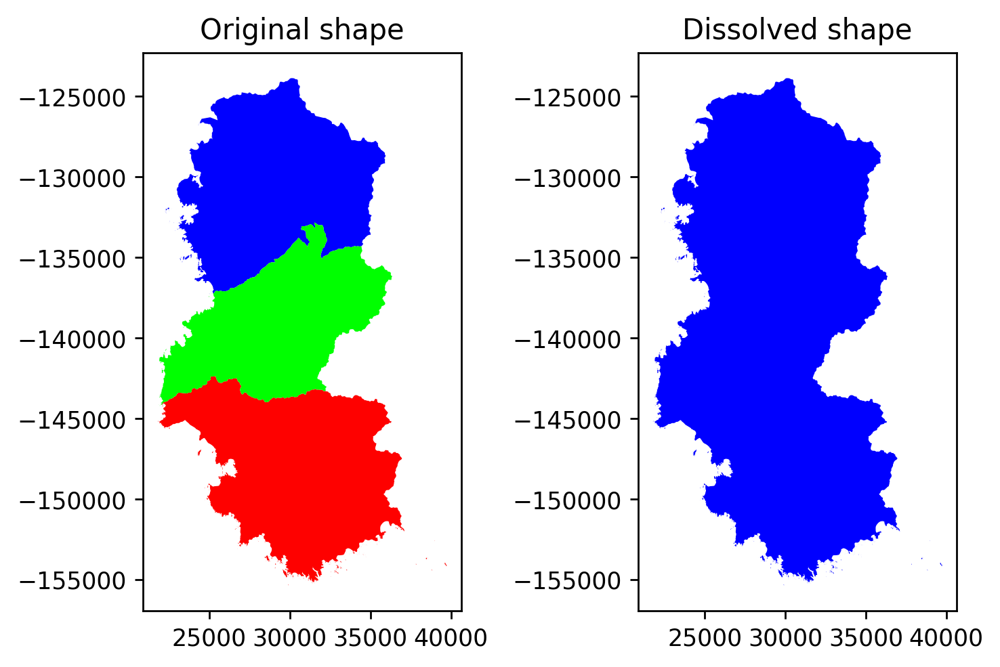

In [25]:
# 松崎町、南伊豆町、西伊豆町のみを行政界データから抽出抽出
gdfNishiIzu = gdf.loc[(gdf.ATTR_11 == '松崎町')|(gdf.ATTR_11 == '南伊豆町')|(gdf.ATTR_11 == '西伊豆町')]
# gdfNishiIzu

extractedGdf = gdfNishiIzu[['ATTR_7','ATTR_6','geometry']]
extractedGdf = extractedGdf.dissolve(by='ATTR_7',aggfunc='sum')

fig, (ax1,ax2) = plt.subplots(1,2,figsize=(6,12))
gdfNishiIzu.plot(ax=ax1,cmap='brg')
extractedGdf.plot(ax=ax2, cmap='brg')
ax1.set_title('Original shape')
ax2.set_title('Dissolved shape')
plt.tight_layout()
plt.show()

In [26]:
# 結合した行政界データを保存する（保存場所はマイドライブ以下が望ましい）
extractedGdf.to_file('/content/drive/MyDrive/extractedExtent.geojson',driver='GeoJSON')

### 教師データ作成のための点データ準備
続いてこの領域から無作為に点を抽出します。この点を含んだピクセルの値を教師データとして取得する
ためです。隣接する各点はそれぞれは500m程度離れています。

In [27]:
# geodataframeから、座標の最大最小を取得
x_min, y_min, x_max, y_max = extractedGdf.total_bounds
npoints = 1000 # set a sample size

random.seed(42)
allPoints = [(x,y) for x in range(int(x_min),int(x_max),500) for y in range(int(y_min),int(y_max),500)]
samplePoints = np.array(random.sample(allPoints, npoints))

x = samplePoints[:,0]
y = samplePoints[:,1]

# 取得した点ををGeoSeriesへ変換
gdf_points = gpd.GeoSeries(gpd.points_from_xy(x, y))

# ポリゴン内のデータのみを保持
gdf_points = gdf_points[gdf_points.within(extractedGdf.unary_union)]
gdf_points = gdf_points.sample(n=500) # sample 500 points
print(gdf_points)

652    POINT (29273.000 -141863.000)
288    POINT (29773.000 -124363.000)
359    POINT (33273.000 -145363.000)
521    POINT (33773.000 -151863.000)
617    POINT (32273.000 -145363.000)
                   ...              
528    POINT (32273.000 -136863.000)
947    POINT (29273.000 -138863.000)
119    POINT (30273.000 -151863.000)
212    POINT (29273.000 -143863.000)
689    POINT (29273.000 -150863.000)
Length: 500, dtype: geometry


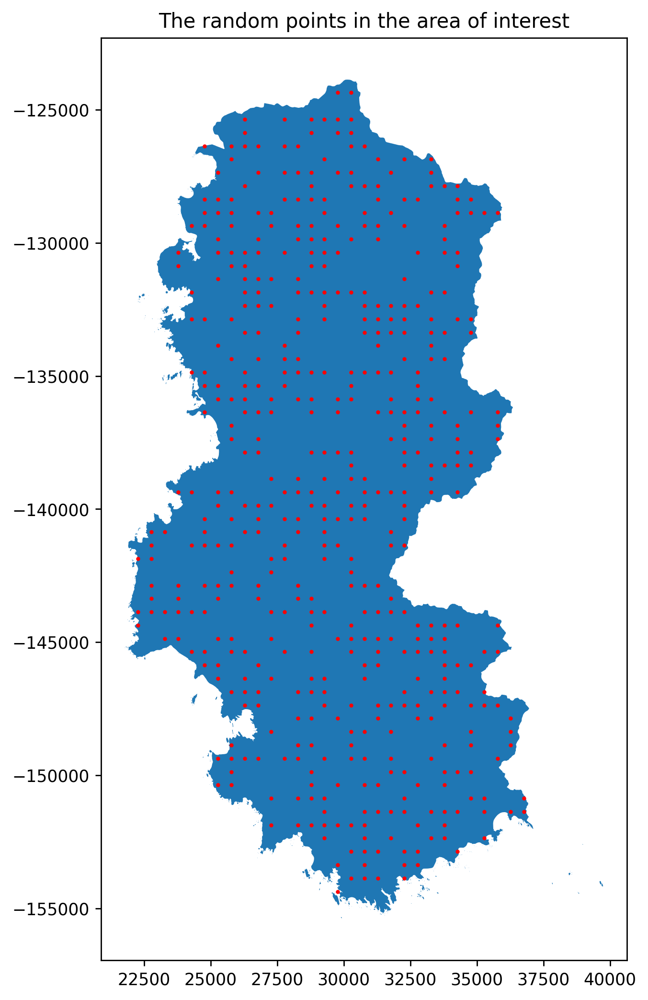

In [28]:
fig, ax = plt.subplots(figsize=(6,10))
extractedGdf.plot(ax=ax)
gdf_points.plot(ax=ax,color='red',markersize=2)
ax.set_title('The random points in the area of interest')
plt.show()

In [29]:
# ポイントデータをgpkgとして保存
gdf_points = gdf_points.set_crs('epsg:2450') # set its crs
point_shp = gpd.GeoDataFrame(geometry=gdf_points)
gdf_points.to_file("/content/drive/MyDrive/RandomPoints2450.gpkg", layer='cities', driver="GPKG")

In [30]:
# S2の画像をクリッピング。加えてCRSの変換も行う行う

def getFeatures(gdf):
    """rasterioで読み取れる形のデータに変換するための関数"""
    return [json.loads(gdf.to_json())['features'][0]['geometry']]

# 画像の読み込み
Rst_red = rxr.open_rasterio(file_url[0],masked=True).squeeze() # B04
Rst_nir = rxr.open_rasterio(file_url[1],masked=True).squeeze() # B08
# print(Rst_red.rio.crs)

# rastrio crsオブジェクトの作成。UTM Zone54NからからJGD2000 CS VIII（平面直角座標第8系）へ変換
jgd2000N8 = CRS.from_string('EPSG:2450')

# 投影変換
Rst_red_jgd = Rst_red.rio.reproject(jgd2000N8)
Rst_nir_jgd = Rst_nir.rio.reproject(jgd2000N8)

# 画像の切り抜き処理
bbox = box(x_min, y_min, x_max, y_max)
geo = gpd.GeoDataFrame({'geometry': bbox}, index=[0], crs=from_epsg(2450))
coords = getFeatures(geo)
# 画像の切り抜き処理
Rst_red_clip = Rst_red_jgd.rio.clip(coords)
Rst_nir_clip = Rst_nir_jgd.rio.clip(coords)

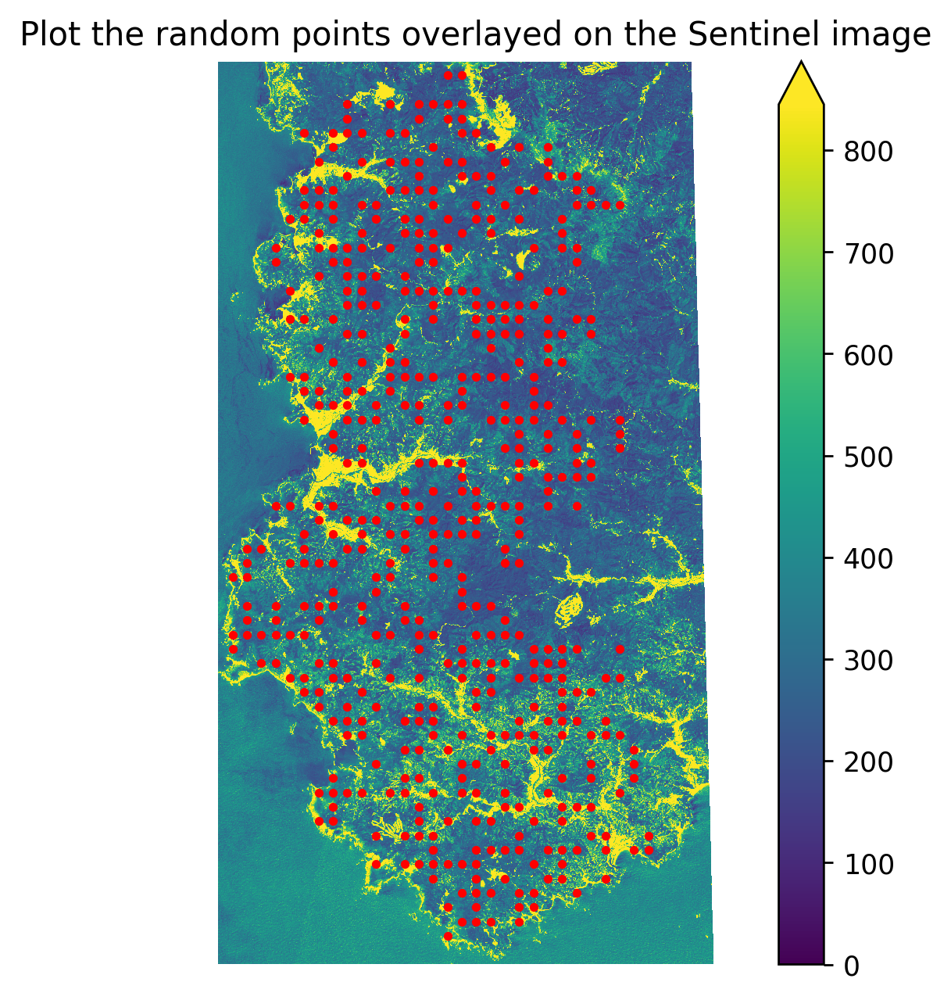

In [31]:
# Rst_red_clip.plot.hist(bins=10) # ピクセルの分布確認用
# 点データとラスタデータをmatplotlibのプロット上に表示する
fig, ax = plt.subplots(figsize=(6,6))
Rst_red_clip.plot.imshow(ax=ax,vmin=0,vmax=Rst_red_clip.quantile(0.95)) # Sentinel-2
point_shp.plot(ax=ax, color='red',markersize=5) # ポイントデータ
ax.set_title('Plot the random points overlayed on the Sentinel image')
ax.set_axis_off()
plt.show()

#### NDVIの計算と取得
NDVIという植生指標を衛星データから算出し、NDVIと樹高データで回帰分析を行います。

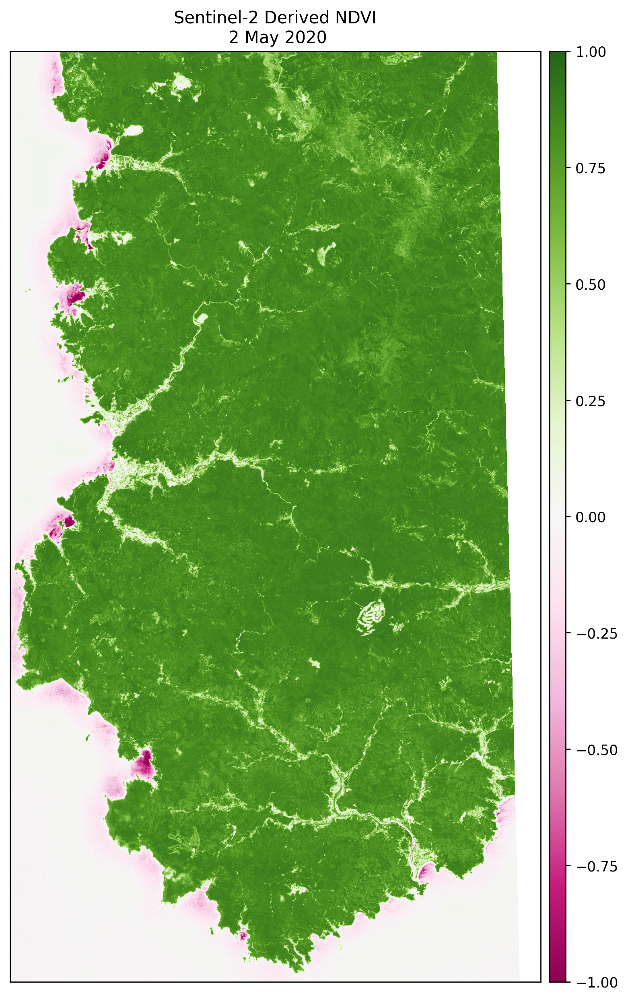

In [32]:
# NDVIを作成し保存
ndvi_clip = es.normalized_diff(Rst_nir_clip,Rst_red_clip)

# 結果を描画
ep.plot_bands(ndvi_clip,
              cmap='PiYG',
              scale=False,
              vmin=-1, vmax=1,
              title="Sentinel-2 Derived NDVI\n 2 May 2020")
plt.show()

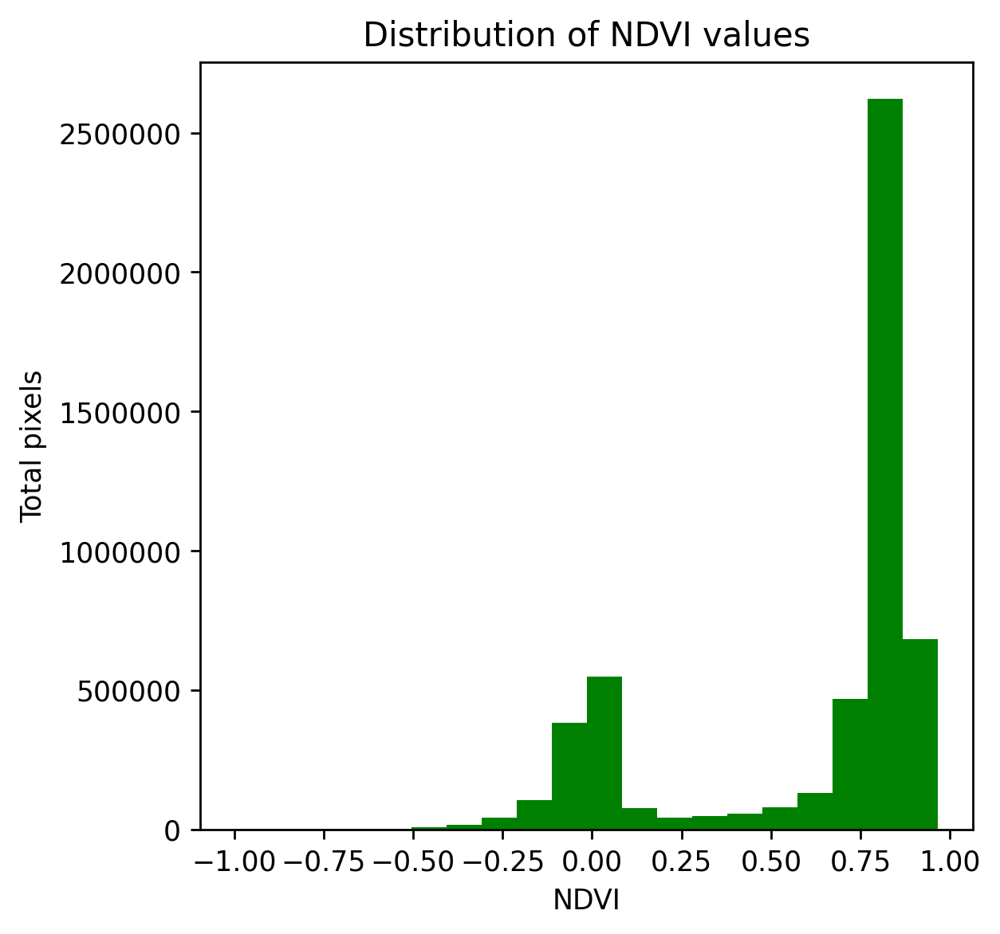

In [33]:
# ヒストグラム作成
ax = ep.hist(ndvi_clip,
             figsize = (5,5),
             colors = 'green',
             xlabel = 'NDVI',
             ylabel = 'Total pixels',
             title = 'Distribution of NDVI values')

# 見栄え調整
ax[1].ticklabel_format(useOffset=False,
                       style='plain')

In [34]:
from rasterstats import point_query
ndvi = (Rst_nir_clip - Rst_red_clip)/ (Rst_nir_clip + Rst_red_clip)
# print(ndvi)

pointfile = '/content/drive/MyDrive/RandomPoints2450.gpkg'
gdf_points = gpd.read_file(pointfile)

gdf_points_stats = pd.DataFrame(point_query(gdf_points, ndvi.values, \
                                            affine=ndvi.rio.transform(),nodata=-999))
gdf_points_stats.columns= ['ndvi']
ndvi_stats_df = gdf_points.join(gdf_points_stats)

In [35]:
ndvi_stats_df

,geometry,ndvi
0,POINT (29273.000 -141863.000),0.854919
1,POINT (29773.000 -124363.000),0.868426
2,POINT (33273.000 -145363.000),0.880340
3,POINT (33773.000 -151863.000),0.793493
4,POINT (32273.000 -145363.000),0.866822
...,...,...
495,POINT (32273.000 -136863.000),0.864703
496,POINT (29273.000 -138863.000),0.842869
497,POINT (30273.000 -151863.000),0.853328
498,POINT (29273.000 -143863.000),0.839034


In [36]:
# 同様の処理を樹高データに対しても行う

# データの読み込み
tree_resampled = rxr.open_rasterio('/content/drive/MyDrive/IzuResMean.tif',masked=True).squeeze()
tree_resampled_clip = tree_resampled.rio.clip(coords)

# 取得する樹木の高さを制限。最小で0mより高く、最大で40m以下とする
tree_resampled_clip_cont = tree_resampled_clip.where((tree_resampled_clip.values > 0)|(tree_resampled_clip.values <= 40),np.nan)

treeHeight_stats = pd.DataFrame(point_query(gdf_points, tree_resampled_clip_cont.values, \
                                            affine=tree_resampled_clip_cont.rio.transform(),nodata=-999))
treeHeight_stats.columns= ['tree_height']
treeHeight_stats_df = gdf_points.join(treeHeight_stats)

In [37]:
print("the minimum raster value is: ", np.nanmin(treeHeight_stats.values))
print("the maximum raster value is: ", np.nanmax(treeHeight_stats.values))

the minimum raster value is:  0.1691405302286181
the maximum raster value is:  30.366986846926817


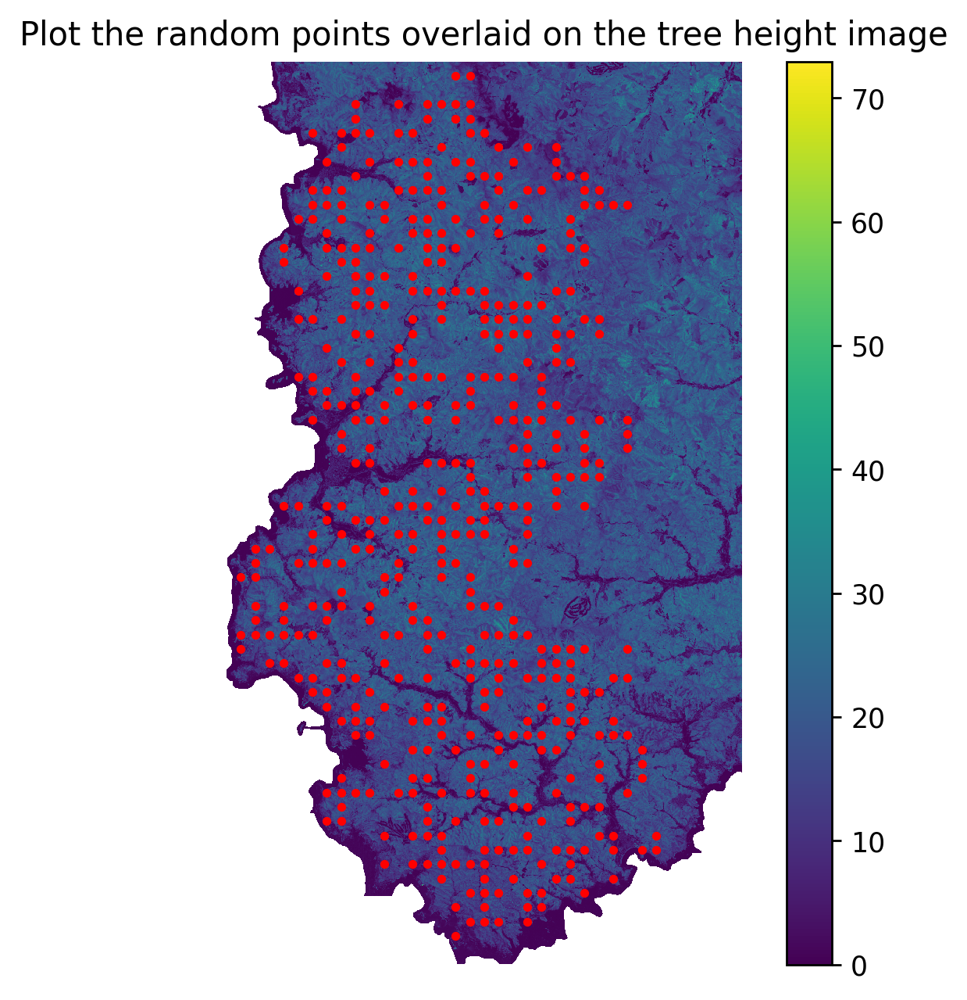

In [38]:
# 点データとラスタデータをmatplotlibのプロット上に表示する
fig, ax = plt.subplots(figsize=(6,6))
tree_resampled_clip.plot.imshow(ax=ax)
point_shp.plot(ax=ax, color='red',markersize=5) # ポイントデータ
ax.set_title('Plot the random points overlaid on the tree height image')
ax.set_axis_off()
plt.show()

In [39]:
# 二つのデータフレームを結合
combinedData = ndvi_stats_df.merge(treeHeight_stats_df, on='geometry')
combinedData = combinedData.dropna()

combinedData.head()

,geometry,ndvi,tree_height
0,POINT (29273.000 -141863.000),0.854919,17.182735
1,POINT (29773.000 -124363.000),0.868426,19.790828
2,POINT (33273.000 -145363.000),0.880340,17.018211
3,POINT (33773.000 -151863.000),0.793493,11.722362
4,POINT (32273.000 -145363.000),0.866822,14.698654


#### 線形回帰の実行
データの準備が整ったので、単回帰を実行します。分類問題と同様にscikit-learnを使って実行します。
モジュールの詳細については[scikit-learnの公式ドキュメント](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LinearRegression.html)を参照してください。

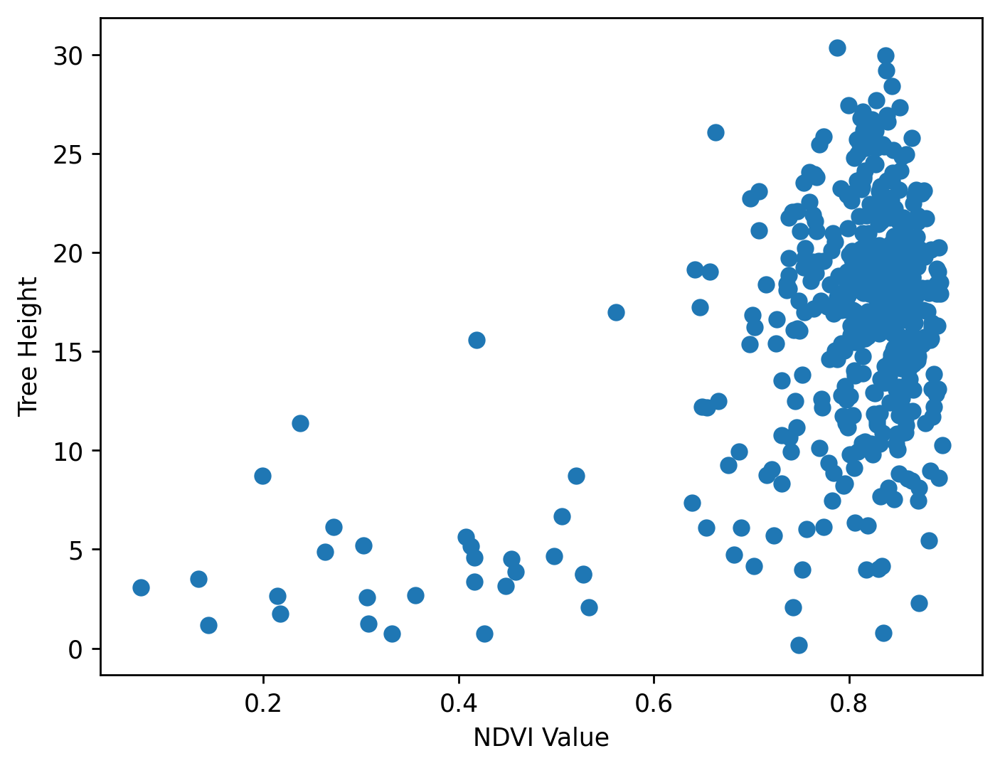

In [40]:
# データの作図
x = combinedData['ndvi']
y = combinedData['tree_height']

plt.xlabel('NDVI Value')
plt.ylabel('Tree Height')
plt.plot(x, y, 'o')
plt.show()

In [41]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

# データセットをトレーニングデータとテストデータに分割
X = np.array(combinedData['ndvi']).reshape(-1,1)
y = np.array(combinedData['tree_height']).reshape(-1,1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# shapeを使って次元を確認
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(400, 1) (100, 1) (400, 1) (100, 1)


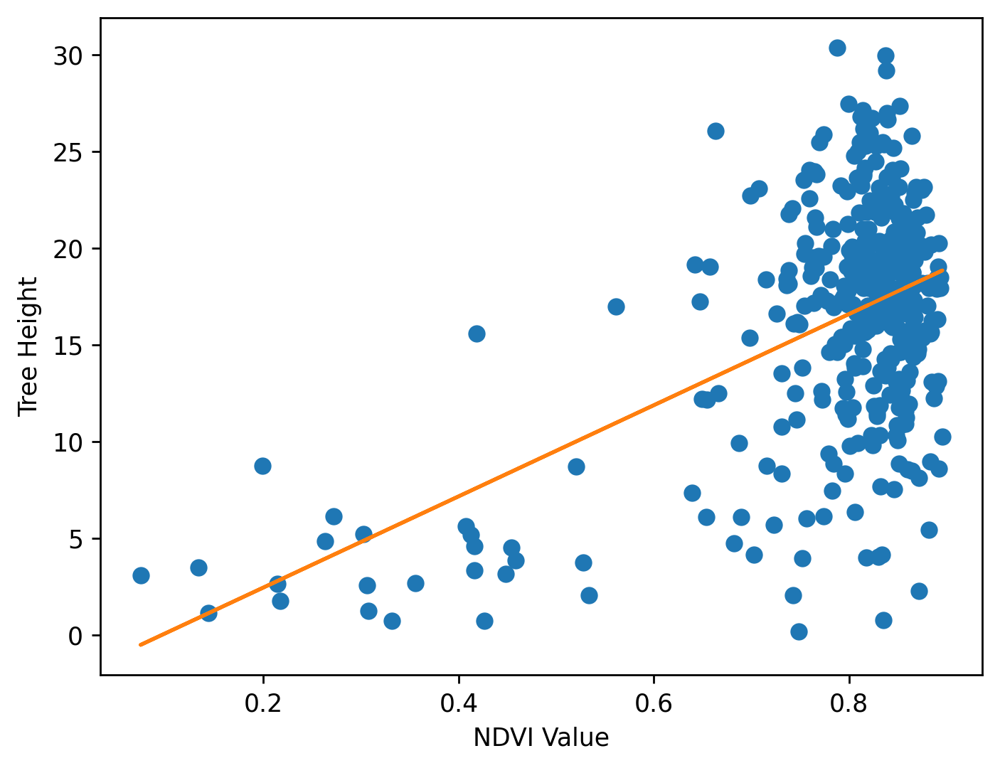

In [42]:
# LinearRegressionクラスのインスタンスを生成
lreg = LinearRegression()
# トレーニング用データを使ってトレーニング
lreg.fit(X_train, y_train)

plt.xlabel('NDVI Value')
plt.ylabel('Tree Height')
plt.plot(X_train, y_train, 'o')
plt.plot(X_train, lreg.predict(X_train), linestyle="solid")
plt.show()

In [43]:
print('y= %.3fx + %.3f' % (lreg.coef_ , lreg.intercept_)) # モデル式
print('決定係数 R^2： ', round(lreg.score(X_train, y_train),2)) # 決定係数によりモデルの当てはまりの良さを確認する

y= 23.566x + -2.262
決定係数 R^2：  0.26


In [44]:
# 訓練データと正解データでモデルの精度を確かめる
from sklearn import metrics
from math import sqrt

y_pred = lreg.predict(X_test)
testR2 = round(metrics.r2_score(y_test,y_pred), 2)
print('決定係数 R^2： ', testR2)

## 平均二乗誤差の確認確認
# print('X_testを使ったモデルの平均二乗誤差＝{:0.2f}'.format(np.mean((y_test - y_pred) ** 2))) # MSE
# RMSE
mse = metrics.mean_squared_error(y_test, y_pred)
rmse = sqrt(mse)
print('RMSE: ', round(rmse,2))

決定係数 R^2：  0.13
RMSE:  4.87
